# IST 718 Laboratory Exercise - 2

Created by: Victoria Haley

Date: 2/1/2024

In [3]:
# Loading necessary libraries
import pandas as pd
import csv
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FuncFormatter
import warnings
warnings.filterwarnings("ignore")
from sklearn import linear_model
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split
import sklearn.metrics as sm
import statsmodels.api as st
import missingno as mi
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
from math import sqrt
from scipy.stats import boxcox
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.statespace.sarimax import SARIMAX
from pmdarima import auto_arima
from statsmodels.stats.diagnostic import acorr_ljungbox
from scipy.stats import shapiro
from scipy.stats import kstest
import pmdarima as pm
from prophet import Prophet

## Research Question: Can we predict which three zip codes provide the best investment opportunity for the Syracuse Real Estate Investment Trust (SREIT)?

## Step 1: Obtain data and understand data structures and data elements

In [4]:
#Function to open/read the file and create dataframe and prints information of DF
def get_data(file):
    data = pd.read_csv(file)
    df = pd.DataFrame(data.values, columns=data.columns, index=data.index)
    return df
   
#Funtion to analyze the data
def analyze_data(data):
    stats = data.describe(include='all')
    print('Descriptive Statistics')
    print(stats)
    nulls = data.isnull().sum()
    print()
    print('Any null values?')
    print(nulls)
    dups = data.duplicated().values.any()
    print()
    print('Any duplicates?')
    print(dups)
    print()
    print('Data Types:')
    print(data.info())
    print()
    print('First 5 Rows of Data Frame:')
    print(data.head())

In [5]:
file = ('http://files.zillowstatic.com/research/public_csvs/zhvi/Zip_zhvi_uc_sfr_month.csv')
df = get_data(file)
analyze_data(df)

Descriptive Statistics
        RegionID  SizeRank  RegionName RegionType StateName  State      City  \
count      29123     29123       29123      29123     29123  29123     27834   
unique     29123     15435       29123          1        51     51     13818   
top        91982     30490       77494        zip        NY     NY  New York   
freq           1       832           1      29123      1672   1672       168   

                                        Metro         CountyName  \
count                                   22162              29123   
unique                                    927               1844   
top     New York-Newark-Jersey City, NY-NJ-PA  Washington County   
freq                                      843                354   

           1996-02-29  ...     2023-03-31     2023-04-30    2023-05-31  \
count    14342.000000  ...   29123.000000   29123.000000   29123.00000   
unique   14342.000000  ...   29123.000000   29123.000000   29123.00000   
top     17472

The information above tells us that there are:
- 29,123 records for real estate prices in the United States from February 1996 to December 2023
- 13,818 Unique Cities
- 17,318 Null values
- StateName and State appear to be the same
- Only Object data types when there are categorical and numerical data

Next, we'll need to update the data frame so that it has the correct data types and handle the nulls.

In [6]:
# Since the data frame is so large, not all of the null valuse information was printed so we'll double check here
# Display rows with null values in the columns above
print('Number of Null Values:')
print(df.isnull().sum().sum())
print()
print('Null Rows in Categorical Data:')
categorical_cols = df[df.columns[:8]]
null_rows_categorical = df[categorical_cols.isnull().any(axis=1)]
print(null_rows_categorical)
print()

print('Null Rows in Numerical Data:')
numerical_cols = df[df.columns[9:]]
null_rows_numerical = df[numerical_cols.isnull().any(axis=1)]
print(null_rows_numerical)

# These results give us a better idea of the data and how the nulls will be handled below

Number of Null Values:
1988538

Null Rows in Categorical Data:
      RegionID SizeRank RegionName RegionType StateName State      City  \
127      71067      132      30349        zip        GA    GA       NaN   
142      72578      148      33411        zip        FL    FL       NaN   
210      91941      216      77450        zip        TX    TX       NaN   
406      98437      416      95828        zip        CA    CA       NaN   
546      93212      556      80022        zip        CO    CO       NaN   
...        ...      ...        ...        ...       ...   ...       ...   
29110    78374    39992      46968        zip        IN    IN  Monterey   
29111    88247    39992      68923        zip        NE    NE       NaN   
29118    75621    39992      40310        zip        KY    KY    Burgin   
29119    94210    39992      83547        zip        ID    ID   Pollock   
29120    77994    39992      46154        zip        IN    IN       NaN   

                                    

## Step 2: Scrub data using scripting methods, to include debugging, for data manipulation

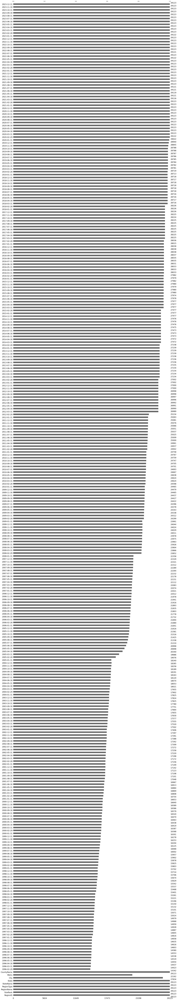

In [7]:
# Visualizing nulls
mi.bar(df)
plt.show()

From this chart we can see that there are nulls in the price columns from February 1996 to February 2020, as well as in the Metro and City columns. Since there is a lot of data, we will begin to handle the nulls by dropping the rows where there are nulls in the Metro column, followed by City. From there, we will impute the nulls of the price column based on median home price. We choose median over mean because of how widely home prices vary. Median is a better way to represent the distribution of the data.

Number of Null Values:
1074491


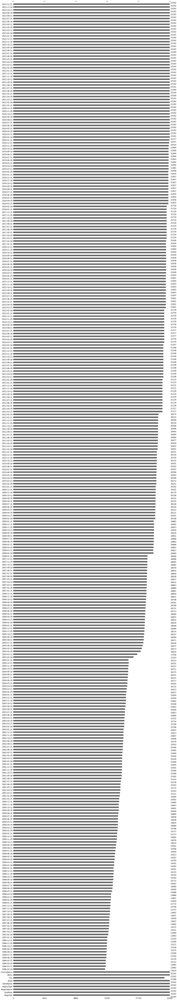

In [8]:
# Dropping nulls in Metro

# Drop rows with null values in the Metro column
df.dropna(subset=['Metro'], inplace=True)

# Verify changes
print('Number of Null Values:')
print(df.isnull().sum().sum())

# Visualizing nulls
mi.bar(df)
plt.show()

After dropping the nulls in the Metro column, there are still 1,074,491 nulls in the data frame. Next, we'll drop nulls from the City column before handling the nulls in price.

Number of Null Values:
1016098


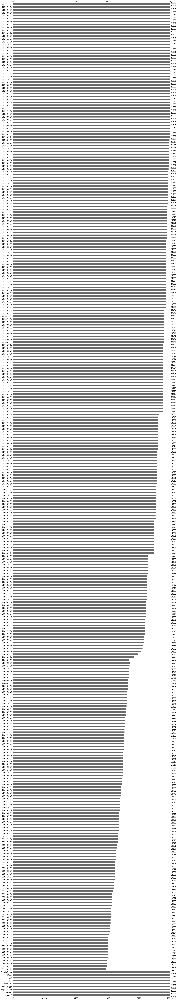

In [9]:
# Dropping nulls in City

# Drop rows with null values in the Metro column
df.dropna(subset=['City'], inplace=True)

# Verify changes
print('Number of Null Values:')
print(df.isnull().sum().sum())

# Visualizing nulls
mi.bar(df)
plt.show()

In [10]:
# Before we impute the data, let's look at what the price data looks like. First, we'll need to make transformations


# Transforming categorical variables from object to factor and quantitative variables from object to numeric

cols_to_convert = df.columns[:9]
# Convert selected columns to category type
df[cols_to_convert] = df[cols_to_convert].astype('category')

# Transforming quantitative data into numeric format
cols_to_convert = df.columns[9:]
# Convert the selected columns to numeric
df[cols_to_convert] = df[cols_to_convert].apply(pd.to_numeric, errors='coerce')


# Verify the changes
print('Data Types:')
print(df.dtypes)
print()

df.describe()

Data Types:
RegionID      category
SizeRank      category
RegionName    category
RegionType    category
StateName     category
                ...   
2023-08-31     float64
2023-09-30     float64
2023-10-31     float64
2023-11-30     float64
2023-12-31     float64
Length: 344, dtype: object



,1996-02-29,1996-03-31,1996-04-30,1996-05-31,1996-06-30,1996-07-31,1996-08-31,1996-09-30,1996-10-31,1996-11-30,...,2023-03-31,2023-04-30,2023-05-31,2023-06-30,2023-07-31,2023-08-31,2023-09-30,2023-10-31,2023-11-30,2023-12-31
count,1.272700e+04,1.279600e+04,1.280800e+04,1.282300e+04,1.288500e+04,1.290100e+04,1.291600e+04,1.294100e+04,1.296400e+04,1.297700e+04,...,2.139800e+04,2.139800e+04,2.139800e+04,2.139800e+04,2.139800e+04,2.139800e+04,2.139800e+04,2.139800e+04,2.139800e+04,2.139800e+04
mean,1.288568e+05,1.292731e+05,1.298368e+05,1.307065e+05,1.321111e+05,1.333420e+05,1.339742e+05,1.340495e+05,1.339094e+05,1.336051e+05,...,3.891681e+05,3.950855e+05,4.006781e+05,4.059306e+05,4.090894e+05,4.092950e+05,4.089135e+05,4.076589e+05,4.058358e+05,4.030458e+05
std,9.290365e+04,9.704014e+04,9.784379e+04,9.843557e+04,1.048931e+05,1.059296e+05,1.069581e+05,1.073352e+05,1.078816e+05,1.084306e+05,...,4.090953e+05,4.131570e+05,4.179503e+05,4.228057e+05,4.236173e+05,4.205737e+05,4.191968e+05,4.190041e+05,4.166573e+05,4.142247e+05
min,7.981130e+03,8.102821e+03,8.231617e+03,8.209750e+03,8.337561e+03,8.501637e+03,8.611964e+03,8.822657e+03,9.102744e+03,9.169073e+03,...,2.640302e+04,2.543945e+04,2.459505e+04,2.470259e+04,2.504346e+04,2.428394e+04,2.378979e+04,2.416706e+04,2.489975e+04,2.477298e+04
25%,7.415318e+04,7.421431e+04,7.463388e+04,7.525059e+04,7.597426e+04,7.669952e+04,7.719436e+04,7.728293e+04,7.722047e+04,7.717425e+04,...,1.911083e+05,1.946996e+05,1.978101e+05,2.004138e+05,2.022975e+05,2.022574e+05,2.021185e+05,2.010289e+05,1.999930e+05,1.977507e+05
50%,1.072593e+05,1.074068e+05,1.078880e+05,1.086282e+05,1.097325e+05,1.106543e+05,1.112922e+05,1.115501e+05,1.113322e+05,1.111018e+05,...,2.864445e+05,2.913565e+05,2.957813e+05,2.998968e+05,3.025643e+05,3.030817e+05,3.028226e+05,3.015061e+05,3.001640e+05,2.978884e+05
75%,1.556857e+05,1.558098e+05,1.564642e+05,1.573179e+05,1.585063e+05,1.598026e+05,1.602284e+05,1.604288e+05,1.600277e+05,1.597318e+05,...,4.468067e+05,4.526888e+05,4.591267e+05,4.649690e+05,4.687059e+05,4.697410e+05,4.695906e+05,4.679593e+05,4.659065e+05,4.632661e+05
max,2.753878e+06,2.868423e+06,3.035933e+06,3.100942e+06,3.863865e+06,3.626587e+06,3.630093e+06,3.706422e+06,3.749491e+06,3.794117e+06,...,1.466423e+07,1.459920e+07,1.466549e+07,1.464460e+07,1.441518e+07,1.407141e+07,1.382604e+07,1.385264e+07,1.382990e+07,1.379625e+07


At a quick glance, we can see that the average prices increase throughout the year (which is expected). We can also see that there is a difference between the average price from about 200,000 to over 1 million, which further solidifies the reason for choosing median over mean. Next, we'll handle the nulls in these columns.

Number of Null Values:
0


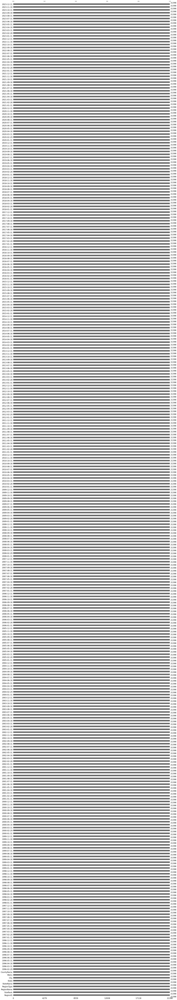

In [11]:
# Fill null values in numerical columns with median
for column in df.select_dtypes(include='number').columns:
    df[column].fillna(df[column].median(), inplace=True)
    
# Verify changes
print('Number of Null Values:')
print(df.isnull().sum().sum())

# Visualizing nulls
mi.bar(df)
plt.show()

In [12]:
# Next, we'll drop RegionID, RegionType, and Statename columns as they are unnecessary for this report
# Drop unnecessary columns
df.drop(columns=['SizeRank','RegionName', 'RegionType', 'StateName'], inplace=True)

In [13]:
# Transforming the dataframe shape
melted_df = pd.melt(df, id_vars=['RegionID', 'State', 'City', 'Metro','CountyName'], 
                     var_name='Date')
melted_df['Date'] = pd.to_datetime(melted_df['Date'], infer_datetime_format=True)
melted_df = melted_df.dropna(subset=['value'])

# Verify changes
melted_df

,RegionID,State,City,Metro,CountyName,Date,value
0,91982,TX,Katy,"Houston-The Woodlands-Sugar Land, TX",Fort Bend County,1996-02-29,174725.633029
1,61148,NJ,Lakewood,"New York-Newark-Jersey City, NY-NJ-PA",Ocean County,1996-02-29,142758.982237
2,91940,TX,Katy,"Houston-The Woodlands-Sugar Land, TX",Harris County,1996-02-29,101043.651448
3,62080,NY,New York,"New York-Newark-Jersey City, NY-NJ-PA",Queens County,1996-02-29,199178.528054
4,91733,TX,Houston,"Houston-The Woodlands-Sugar Land, TX",Harris County,1996-02-29,95468.094264
...,...,...,...,...,...,...,...
7168325,97312,CA,Ridgecrest,"Riverside-San Bernardino-Ontario, CA",San Bernardino County,2023-12-31,88739.293336
7168326,68435,WV,Cabin Creek,"Charleston, WV",Kanawha County,2023-12-31,78017.151510
7168327,67368,VA,Haywood,"Washington-Arlington-Alexandria, DC-VA-MD-WV",Madison County,2023-12-31,365146.492083
7168328,64515,PA,Oak Ridge,"Pittsburgh, PA",Armstrong County,2023-12-31,84712.236868


In [14]:
# Calculating Return On Investment (ROI)

# Define a function to calculate ROI
def calculate_roi(initial_value, final_value, years):
    return ((final_value - initial_value) / initial_value) * 100 / years

# Initialize lists to store ROI values
roi_5_years = []
roi_3_years = []

# Group by 'RegionID'
grouped = melted_df.groupby('RegionID')

# Calculate ROI for each RegionID
for name, group in grouped:
    # Sort group by 'Date'
    group = group.sort_values(by='Date')
    
    # Filter data for 5-year period
    start_date_5_years = group['Date'].min()
    end_date_5_years = start_date_5_years + pd.DateOffset(years=5)
    group_5_years = group[(group['Date'] >= start_date_5_years) & (group['Date'] <= end_date_5_years)]
    
    # Filter data for 3-year period
    start_date_3_years = group['Date'].min()
    end_date_3_years = start_date_3_years + pd.DateOffset(years=3)
    group_3_years = group[(group['Date'] >= start_date_3_years) & (group['Date'] <= end_date_3_years)]
    
    # Calculate initial and final values for 5-year period
    initial_value_5_years = group_5_years.iloc[0]['value']
    final_value_5_years = group_5_years.iloc[-1]['value']
    
    # Calculate initial and final values for 3-year period
    initial_value_3_years = group_3_years.iloc[0]['value']
    final_value_3_years = group_3_years.iloc[-1]['value']
    
    # Calculate ROI for each period
    roi_5_years.append(calculate_roi(initial_value_5_years, final_value_5_years, 5))
    roi_3_years.append(calculate_roi(initial_value_3_years, final_value_3_years, 3))


# Merge ROI values back into the original DataFrame based on 'RegionID'
melted_df = pd.merge(melted_df, pd.DataFrame({'RegionID': grouped.groups.keys(), 'ROI_5_years': roi_5_years,
                                              'ROI_3_years': roi_3_years}), on='RegionID', how='left')

# Display ROI values for each RegionID
print(melted_df[['RegionID', 'ROI_5_years', 'ROI_3_years']].head())

   RegionID  ROI_5_years  ROI_3_years
0     91982     4.511868     3.476995
1     61148     6.435196     2.875607
2     91940     1.847018     1.034042
3     62080    10.944091     5.332341
4     91733     1.947977     0.645547


In [15]:
# Descriptive stats on new df
df = melted_df
analyze_data(df)

Descriptive Statistics
            RegionID    State      City  \
count   7.168330e+06  7168330   7168330   
unique           NaN       51     10811   
top              NaN       CA  New York   
freq             NaN   499485     56280   
first            NaN      NaN       NaN   
last             NaN      NaN       NaN   
mean    8.048552e+04      NaN       NaN   
std     3.090798e+04      NaN       NaN   
min     5.819600e+04      NaN       NaN   
25%     6.738600e+04      NaN       NaN   
50%     7.792250e+04      NaN       NaN   
75%     8.939500e+04      NaN       NaN   
max     8.087390e+05      NaN       NaN   

                                        Metro          CountyName  \
count                                 7168330             7168330   
unique                                    927                1241   
top     New York-Newark-Jersey City, NY-NJ-PA  Los Angeles County   
freq                                   281400               91120   
first                        

Our new data frame is ready to explore!

## Step 3: Explore data using essential qualitative analysis techniques including descriptive statistics

### Visualizations

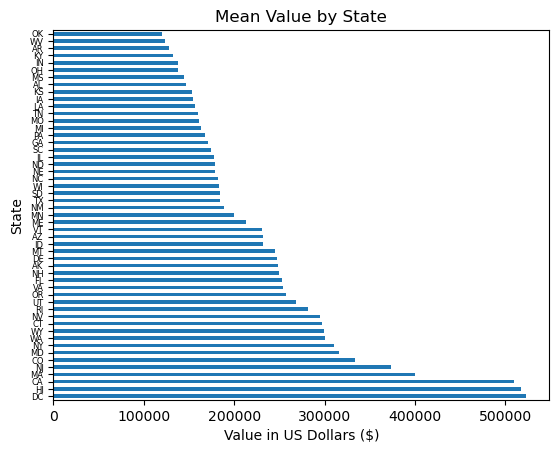

In [16]:
# Bar chart of mean values by state
states = df.groupby('State')
states = states.value.mean()
states = states.sort_values(ascending=False)
states.plot.barh()
plt.title('Mean Value by State')
plt.xlabel('Value in US Dollars ($)')
plt.yticks(size=6)
plt.show()

Washington D.C. has the highest overall average value. However, when looking at the states:

Top 5 Most Expensive States:
1. Hawaii
2. California
3. Massachusetts
4. New Jersey
5. Colorado

Top 5 Least Expensive States:

46. Indiana
47. Kentucky
48. Arkansas
49. West Virginia
50. Oklahoma

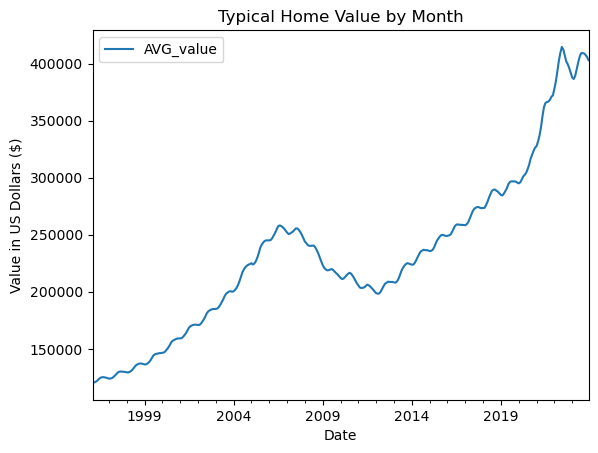

In [17]:
# Plotting time series data of the entire data frame on national level
monthly_data = df.groupby('Date')['value'].mean()
monthly_data = monthly_data.reset_index()
monthly_data.columns = ['Date', 'AVG_value']
monthly_data.plot(x='Date',y='AVG_value')
plt.title('Typical Home Value by Month')
plt.ylabel('Value in US Dollars ($)')
plt.show()

The data shows a steady, and decently increasing value from 1996 to about 2007 (Housing Bubble), until the crash in 2008. The market picked back up in 2012 and steadily increased until it shot up around 2021 (COVID effects) before starting to bounce around a bit towards the end of 2023.

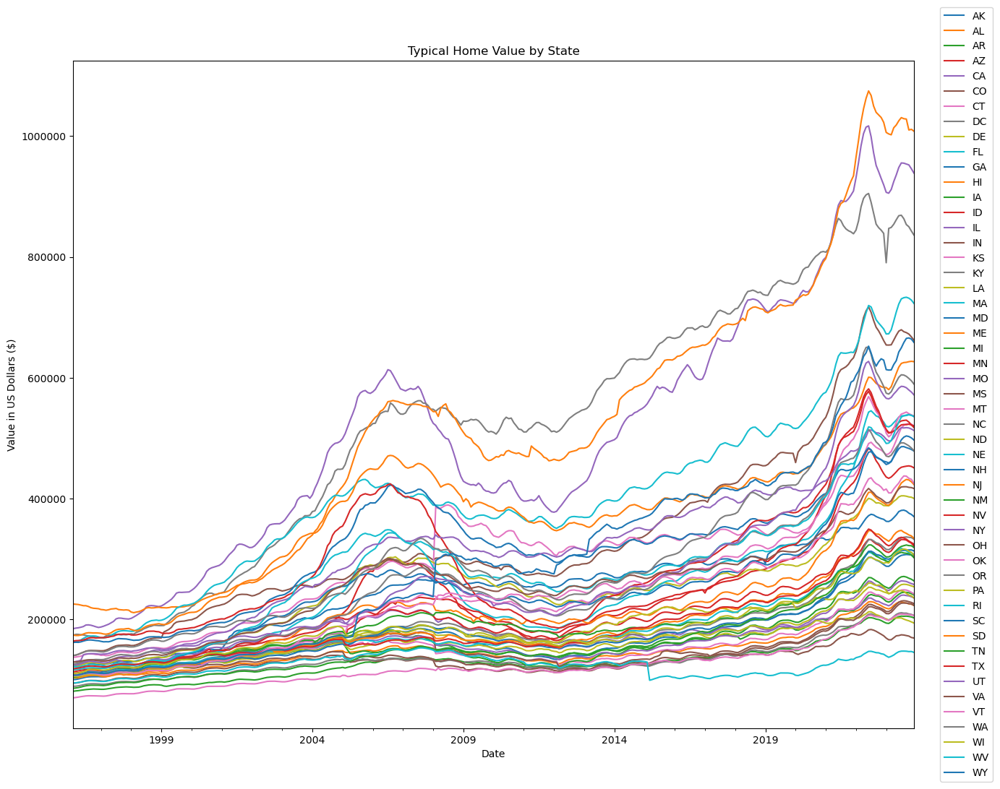

In [18]:
# Plotting time series data of the entire data frame on state level

# Creating state specific df
state_data = df.groupby(['Date','State'])['value'].mean()
state_data = state_data.reset_index()
state_data.columns = ['Date','State', 'AVG_value']
state_data = state_data.pivot(index='Date', columns='State', values='AVG_value')

# Plot
ax = state_data.plot(figsize=(15,12))

# Set y-axis tick format to disable scientific notation
ax.ticklabel_format(style='plain', axis='y')

plt.title('Typical Home Value by State')
plt.xlabel('Date')
plt.ylabel('Value in US Dollars ($)')
plt.legend(loc='center right',bbox_to_anchor=[1.1,0.5])
plt.show()

Here we can see that values in each state steadily increased for the most part, with some at faster rates than others. Hawaii, California, and Washington DC have had average values around 800,000 since 2019, while the rest of the states have been under \$700,000.

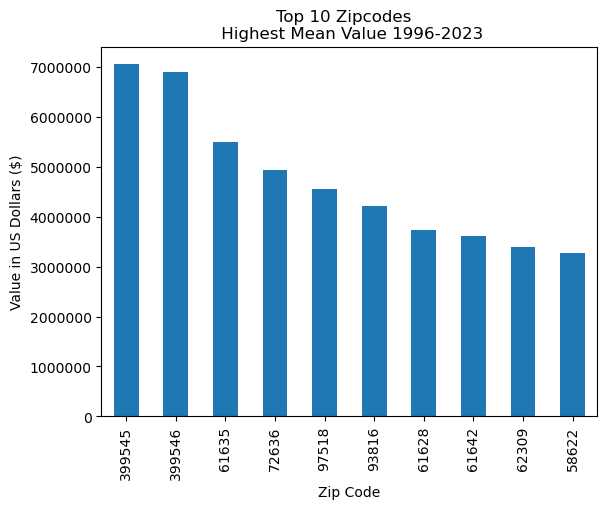

Information for Top 10 Zip Codes:
       RegionID        City State                                    Metro
3861     399545    New York    NY    New York-Newark-Jersey City, NY-NJ-PA
3981     399546    New York    NY    New York-Newark-Jersey City, NY-NJ-PA
1798      61635    New York    NY    New York-Newark-Jersey City, NY-NJ-PA
8711      72636  Palm Beach    FL  Miami-Fort Lauderdale-Pompano Beach, FL
10501     97518    Atherton    CA       San Francisco-Oakland-Berkeley, CA
8403      93816       Aspen    CO                     Glenwood Springs, CO
3234      61628    New York    NY    New York-Newark-Jersey City, NY-NJ-PA
1346      61642    New York    NY    New York-Newark-Jersey City, NY-NJ-PA
19625     62309  Sagaponack    NY    New York-Newark-Jersey City, NY-NJ-PA
12585     58622      Boston    MA           Boston-Cambridge-Newton, MA-NH


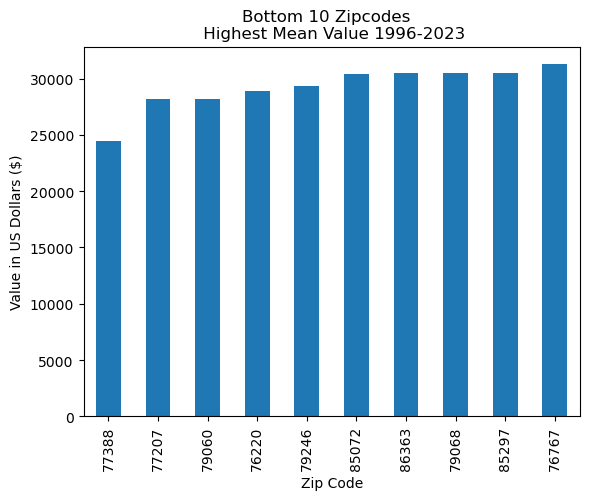

Information for Bottom 10 Zip Codes:
       RegionID         City State                              Metro
11526     77388    Mansfield    OH                      Mansfield, OH
9233      77207   Youngstown    OH  Youngstown-Warren-Boardman, OH-PA
3132      79060      Detroit    MI        Detroit-Warren-Dearborn, MI
17420     76220  New Concord    KY                         Murray, KY
6226      79246        Flint    MI                          Flint, MI
8467      85072       Peoria    IL                         Peoria, IL
11177     86363  Kansas City    MO                 Kansas City, MO-KS
5961      79068      Detroit    MI        Detroit-Warren-Dearborn, MI
13639     85297      Madison    IL                   St. Louis, MO-IL
7683      76767       Toledo    OH                         Toledo, OH


In [19]:
# Plotting highest average value by zip code
zipcode_grp = df.groupby('RegionID')
mean_value = zipcode_grp.value.mean()
mean_value = mean_value.sort_values(ascending=False).head(10)

# Plot

ax = mean_value.plot.bar()

# Set y-axis tick format to disable scientific notation
ax.ticklabel_format(style='plain', axis='y')

plt.title('Top 10 Zipcodes  \n Highest Mean Value 1996-2023')
plt.xlabel('Zip Code')
plt.ylabel('Value in US Dollars ($)')
plt.show()

# Get the top 10 zip codes
top_10_zipcodes = mean_value.index.tolist()

# Filter the original DataFrame to include only the rows corresponding to the top 10 zip codes
top_10_zipcodes_info = df[df['RegionID'].isin(top_10_zipcodes)]

# Extract the desired information (city, state, metro) for each zip code
top_10_zipcodes_info = top_10_zipcodes_info[['RegionID', 'City', 'State', 'Metro']].drop_duplicates()

# Merge the top_10_zipcodes_info DataFrame with the mean_value Series
top_10_zipcodes_info = top_10_zipcodes_info.merge(mean_value, left_on='RegionID', right_index=True)

# Sort the merged DataFrame by the mean values in descending order
top_10_zipcodes_info = top_10_zipcodes_info.sort_values(by='value', ascending=False)

# Drop value column for readability
top_10_zipcodes_info.drop(columns=['value'], inplace=True)

# Print the information for each zip code
print("Information for Top 10 Zip Codes:")
print(top_10_zipcodes_info)

# Plotting lowest average value by zip code
zipcode_grp = df.groupby('RegionID')
mean_value = zipcode_grp.value.mean()
mean_value = mean_value.sort_values(ascending=True).head(10)

# Plot

ax = mean_value.plot.bar()

# Set y-axis tick format to disable scientific notation
ax.ticklabel_format(style='plain', axis='y')

plt.title('Bottom 10 Zipcodes  \n Highest Mean Value 1996-2023')
plt.xlabel('Zip Code')
plt.ylabel('Value in US Dollars ($)')
plt.show()

# Get the bottom 10 zip codes
bot_10_zipcodes = mean_value.index.tolist()

# Filter the original DataFrame to include only the rows corresponding to the bottom 10 zip codes
bot_10_zipcodes_info = df[df['RegionID'].isin(bot_10_zipcodes)]

# Extract the desired information (city, state, metro) for each zip code
bot_10_zipcodes_info = bot_10_zipcodes_info[['RegionID', 'City', 'State', 'Metro']].drop_duplicates()

# Merge the bot_10_zipcodes_info DataFrame with the mean_value Series
bot_10_zipcodes_info = bot_10_zipcodes_info.merge(mean_value, left_on='RegionID', right_index=True)

# Sort the merged DataFrame by the mean values in ascending order
bot_10_zipcodes_info = bot_10_zipcodes_info.sort_values(by='value', ascending=True)

# Drop value column for readability
bot_10_zipcodes_info.drop(columns=['value'], inplace=True)

# Print the information for each zip code
print("Information for Bottom 10 Zip Codes:")
print(bot_10_zipcodes_info)

Five of the top 10 zip codes with the highest average value (including the top 3) are in New York City, NY, with Palm Beach, FL, Atherton, CA, Aspen, CO, and Boston, MA occupying the other spots.

Ohio and Michigan each had 3 of the lowest average values among zip codes, with Mansfield, OH having the lowest value. New Concord, KY, Peoria, IL, Kansas City, MO, and Madison, IL are also among the list.

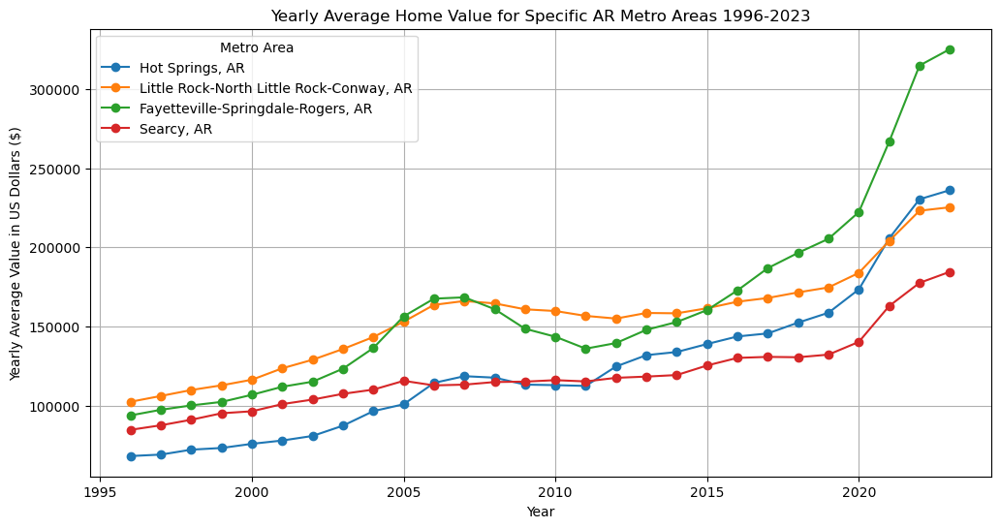

In [20]:
# Plotting yearly average home value for Hot Springs, Little Rock, Fayetteville, Searcy Metro Areas 1996-2023

# Define the state
state_name = 'AR'

# Define the metro areas of interest
metros = ['Hot Springs, AR', 'Little Rock-North Little Rock-Conway, AR', 'Fayetteville-Springdale-Rogers, AR', 'Searcy, AR']

# Select data for the specified state and metro areas
state_data = df[(df['State'] == state_name) & (df['Metro'].isin(metros))]

# Convert 'Date' column to datetime type
state_data['Date'] = pd.to_datetime(state_data['Date'])

# Group data by metro area and year, and calculate the yearly average home value
yearly_avg_values = state_data.groupby([state_data['Date'].dt.year, 'Metro'])['value'].mean()

# Unstack the multi-index to pivot the data and create separate columns for each metro area
yearly_avg_values = yearly_avg_values.unstack()

# Plot the yearly average home value for each metro area
plt.figure(figsize=(12, 6))
for metro in metros:
    yearly_avg_values[metro].plot(marker='o', linestyle='-', label=metro)

plt.title('Yearly Average Home Value for Specific AR Metro Areas 1996-2023')
plt.ylabel('Yearly Average Value in US Dollars ($)')
plt.xlabel('Year')
plt.legend(title='Metro Area')
plt.grid(True)
plt.show()

Like seen above, each metro area has increased in price over the years. The Little Rock- North Little Rock-Conway (LNC) and Fayetteville-Springdale-Rogers (FSR) metro areas began to battle for the top spot around 2004, with the FSR area briefly taking over around 2005 until taking a big hit during the 2008 Housing Crisis, before ultimately taking over again for good in 2015. Since then, the FSR metro area has proven to be the most valuable metro area, with average prices over \$200,000 since 2020.

On the other hand, the Searcy and Hot Springs metro areas continued to have the lowest average values, with Searcy having the lowest since around 2012. Neither area seemed to have been impacted much by the 2008 Housing Crisis.

In [21]:
# Which states have highest average ROI?

# Calculate average ROI_3_years and ROI_5_years for each state
average_roi = df.groupby('State')[['ROI_3_years', 'ROI_5_years']].mean()

# Sort states based on average ROI_3_years and ROI_5_years
sorted_states_roi_3 = average_roi.sort_values(by='ROI_3_years', ascending=False)
sorted_states_roi_5 = average_roi.sort_values(by='ROI_5_years', ascending=False)

# Get the states with the highest average ROI_3_years and ROI_5_years
top_states_roi_3 = sorted_states_roi_3.head(5)  
top_states_roi_5 = sorted_states_roi_5.head(5)  

print("States with the highest average ROI_3_years:")
print(top_states_roi_3)

print("\nStates with the highest average ROI_5_years:")
print(top_states_roi_5)

States with the highest average ROI_3_years:
       ROI_3_years  ROI_5_years
State                          
CO        9.897892    12.478072
MA        6.992634    11.188081
MI        6.634247     7.891626
GA        6.448848     7.661672
NM        6.390784     6.161464

States with the highest average ROI_5_years:
       ROI_3_years  ROI_5_years
State                          
CO        9.897892    12.478072
MA        6.992634    11.188081
CA        5.928914     9.933012
NH        5.524948     9.476540
MI        6.634247     7.891626


Here, we can see that Colorado, Massachusetts, Michigan, Georgia, New Mexico, California, and New Hampshire have the highest average return on investment. As such, we'll focus on those states.

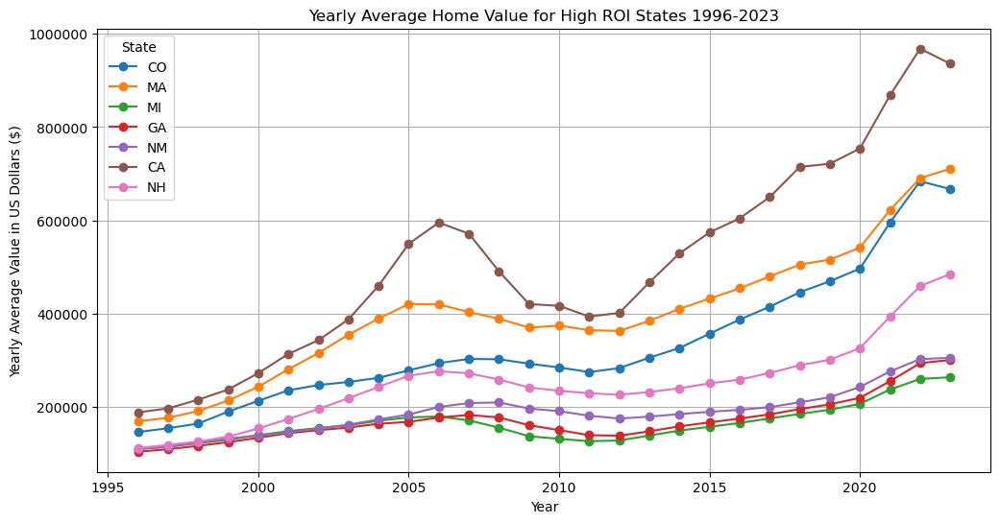

In [26]:
# Plotting yearly average home value for the states with highest ROI 1996-2023

# Define the state
state_name = ['CO','MA','MI','GA','NM','CA','NH']

# Select data for the specified states
state_data = df[df['State'].isin(state_name)]

# Convert 'Date' column to datetime type
state_data['Date'] = pd.to_datetime(state_data['Date'])

# Group data by year, and calculate the yearly average home value
yearly_avg_values = state_data.groupby([state_data['Date'].dt.year, 'State'])['value'].mean().unstack()

# Plot the yearly average home value for each state
plt.figure(figsize=(12, 6))
for state in state_name:
    yearly_avg_values[state].plot(marker='o', linestyle='-', label=state)

plt.title('Yearly Average Home Value for High ROI States 1996-2023')
plt.ylabel('Yearly Average Value in US Dollars ($)')
plt.xlabel('Year')
plt.legend(title='State')
plt.grid(True)

# Prevent y-axis ticks from being displayed in scientific notation
plt.ticklabel_format(style='plain', axis='y')

plt.show()

Of the states with the highest ROI, California has always had the highest average value, followed by Massachusetts and Colorado. As of 2021, those states have had an average median home price of at least \$600,000. 

Michigan, Georgia, and New Mexico have the lowest average median home price at around \$300,000. These states also seem to not have been impacted by the 2008 Housing Crisis or the COVID bubble as much as the more expensive states.

## Step 4: Model relationships between data using the appropriate analytical methodologies matched to the information and the needs of clients and users

Developing model(s) for forecasting average median housing value by zip code for 2018 using data from 1997 to 2017.

### First: Is our time series stationary or not? 

In [27]:
# Convert the 'Date' column to datetime type
df['Date'] = pd.to_datetime(df['Date'])

# Set 'Date' as the index
df.set_index('Date', inplace=True)

# Filter the data for the years 1997 to 2018 and specified states
states_of_interest = ['CO', 'MA', 'MI', 'GA', 'NM', 'CA','NH']
df_filtered = df.loc[(df.index.year >= 1997) & (df.index.year <= 2018) & (df['State'].isin(states_of_interest))]

# Group data by RegionID and resample the data to monthly frequency, calculating the mean
avg_value_by_region = df_filtered.groupby('RegionID').resample('MS')['value'].mean()

# Reset index to flatten the DataFrame
mdf = avg_value_by_region.reset_index()

# Print the first few rows of the resulting DataFrame
print(mdf)

         RegionID       Date          value
0           58196 1997-01-01  108333.768017
1           58196 1997-02-01  107566.290236
2           58196 1997-03-01  107262.640816
3           58196 1997-04-01  107980.071243
4           58196 1997-05-01  109342.227794
...           ...        ...            ...
1016395    808739 2018-08-01  354652.564248
1016396    808739 2018-09-01  353576.686183
1016397    808739 2018-10-01  351529.639397
1016398    808739 2018-11-01  350267.474508
1016399    808739 2018-12-01  350558.922801

[1016400 rows x 3 columns]


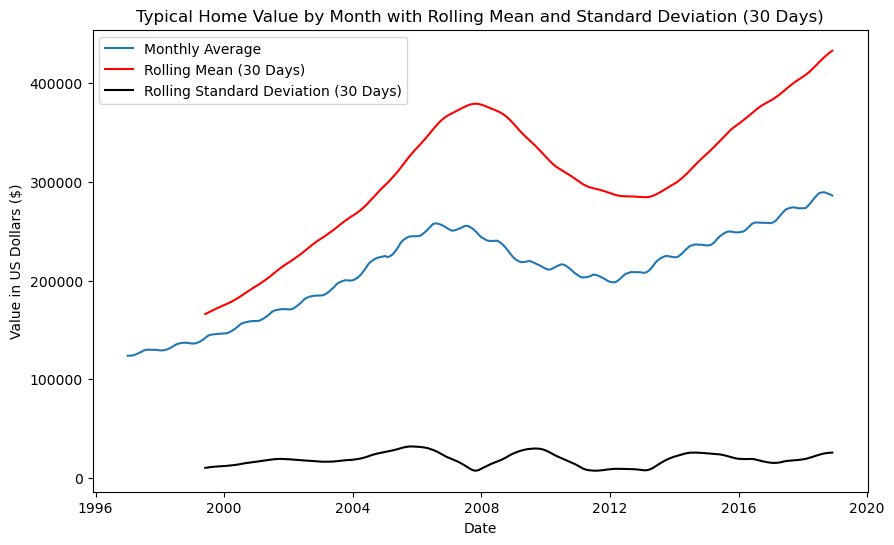

In [30]:
# Calculate the rolling mean and rolling standard deviation for 30 day windows

# Calculate the rolling mean for 30 day windows
rolling_mean = mdf.groupby('Date')['value'].mean().rolling(window=30).mean()

# Calculate the rolling std for 30 day windows
rolling_std = mdf.groupby('Date')['value'].mean().rolling(window=30).std()


# Plotting monthly data and rolling mean on the same plot
plt.figure(figsize=(10, 6))

# Filter the data for the years 1997 to 2018

# Set 'Date' as the index
monthly_data.set_index('Date', inplace=True)

# Filter the data for the years 1997 to 2018
md_filtered = monthly_data.loc['1997':'2018']

# Resample the data to quarterly frequency, calculating the mean
md_filtered = md_filtered.resample('MS').mean()

# Plot monthly data
plt.plot(md_filtered.index, md_filtered['AVG_value'], label='Monthly Average')

# Plot rolling mean
plt.plot(rolling_mean.index, rolling_mean.values, color='red', label='Rolling Mean (30 Days)')

# Plot rolling std
plt.plot(rolling_std.index, rolling_std.values, color='black', label='Rolling Standard Deviation (30 Days)')


# Add title and labels
plt.title('Typical Home Value by Month with Rolling Mean and Standard Deviation (30 Days)')
plt.xlabel('Date')
plt.ylabel('Value in US Dollars ($)')
plt.legend()

# Show plot
plt.show()

Seeing that the rolling mean is consistently above the monthly average data, it suggests that the data tends to have an overall increasing trend over time. The rolling mean smooths out short-term fluctuations and highlights longer-term trends in the data. When the rolling mean is above the raw data, it indicates that, on average, the values in the data are increasing over the window of observation.


A low rolling standard deviation indicates that the data points are tightly clustered around the rolling mean. This could imply that the data is relatively stable or exhibits low volatility during the observed period. The rolling hills indicate periods where there might be slight fluctuations in the variability of the data points around the rolling mean. These fluctuations could be caused by periodic changes or patterns in the underlying data, which also seem to correspond with the 2008 Housing Crisis.

In [31]:
df_filtered.reset_index(inplace=True)
print(df_filtered)

              Date  RegionID State            City  \
0       1997-01-31     95992    CA     Los Angeles   
1       1997-01-31     96193    CA         Norwalk   
2       1997-01-31     96361    CA     Los Angeles   
3       1997-01-31     70829    GA   Lawrenceville   
4       1997-01-31     96025    CA     Los Angeles   
...            ...       ...   ...             ...   
1016395 2018-12-31     98388    CA            Yolo   
1016396 2018-12-31     98370    CA          Brooks   
1016397 2018-12-31     98263    CA  Fields Landing   
1016398 2018-12-31     98183    CA     Camp Meeker   
1016399 2018-12-31     97312    CA      Ridgecrest   

                                        Metro             CountyName  \
0          Los Angeles-Long Beach-Anaheim, CA     Los Angeles County   
1          Los Angeles-Long Beach-Anaheim, CA     Los Angeles County   
2          Los Angeles-Long Beach-Anaheim, CA     Los Angeles County   
3        Atlanta-Sandy Springs-Alpharetta, GA        Gwinnett C

In [32]:
# Building prophet model from df_filtered

# Select train and test sets.
train = df_filtered[(df_filtered['Date'] >= '1997-01-31') & (df_filtered['Date'] <= '2017-12-31')]
test = df_filtered[(df_filtered['Date'] >='2018-01-31') & (df_filtered['Date'] <='2018-12-31')]

# Keep date, value, and RegionID; rename to ds, y, and zipcode.
to_keep = ['Date','value', 'State', 'RegionID']
train = train[to_keep]
train.columns = ['ds', 'y', 'State', 'zipcode']
print('Training Data:')
print(train.head())

test = test[to_keep]
test.columns = ['ds', 'y', 'State', 'zipcode']
print('Testing Data:')
print(test.head())

Training Data:
          ds              y State  zipcode
0 1997-01-31  111808.139032    CA    95992
1 1997-01-31  139795.116084    CA    96193
2 1997-01-31  113990.344652    CA    96361
3 1997-01-31  120961.816165    GA    70829
4 1997-01-31  115138.766134    CA    96025
Testing Data:
               ds              y State  zipcode
970200 2018-01-31  363016.568288    CA    95992
970201 2018-01-31  454219.380438    CA    96193
970202 2018-01-31  430378.198276    CA    96361
970203 2018-01-31  199757.781707    GA    70829
970204 2018-01-31  377530.193747    CA    96025


In [33]:
# Aggregate the data to ensure unique (ds, zipcode) pairs
train_agg = train.groupby(['ds', 'zipcode']).agg({'y': 'mean'}).reset_index()
test_agg = test.groupby(['ds', 'zipcode']).agg({'y': 'mean'}).reset_index()

# Now pivot the aggregated data
train_pivot = train_agg.pivot(index='ds', columns='zipcode', values='y')
test_pivot = test_agg.pivot(index='ds', columns='zipcode', values='y')

This block is in markdown to cut out the long output messages and declutter the notebook.
def prophet_train(data):
    
    # Initialize Prophet model
    model = Prophet(interval_width=0.95, changepoint_prior_scale=6, yearly_seasonality=True,
                    seasonality_prior_scale=1, weekly_seasonality=False, daily_seasonality=False)
    
    # Add monthly seasonality
    model.add_seasonality(name='monthly', period=30.5, fourier_order=4)  # Assuming monthly seasonality
    
    # Fit the model
    model.fit(data)
    
    # Make future dataframe for predictions
    future_dates = model.make_future_dataframe(periods=12, freq='MS')
    
    # Generate forecast
    forecast = model.predict(future_dates)
    
    # Select relevant columns and add zipcode for identification
    forecast = forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]
    forecast['zipcode'] = data['zipcode'].iloc[0]
    
    return forecast

# Get unique zipcodes from train data
zipcodes = train['zipcode'].unique()

# Initialize list to store individual forecast DataFrames
forecast_dfs = []

# Loop over each zipcode and generate forecast
for i in zipcodes:
    data = train[train['zipcode'] == i]
    result = prophet_train(data)
    forecast_dfs.append(result)

# Concatenate all forecast DataFrames into a single DataFrame
forecasts = pd.concat(forecast_dfs, ignore_index=True)

# Save forecasts to a CSV file
forecasts.to_csv('forecasts.csv', index=False)

In [35]:
# Load csv with forecasted results
results = pd.read_csv('forecasts.csv', index_col=False)

# Convert ds to datetime and zipcode to object to merge with the test results
results['ds'] = pd.to_datetime(results['ds'])
results['ds'] = results['ds'] + pd.offsets.MonthEnd(0)  # Adjust the dates to the last day of each month

results['zipcode'] = results.zipcode.astype(object)
results.tail()

,ds,yhat,yhat_lower,yhat_upper,zipcode
1016395,2018-08-31,59032.797182,44695.384213,78472.167540,97312
1016396,2018-09-30,57645.973638,39613.771079,78833.491617,97312
1016397,2018-10-31,59373.820965,39369.600892,83402.421613,97312
1016398,2018-11-30,57787.826911,34061.546449,84926.172431,97312
1016399,2018-12-31,59679.775607,32810.883809,90000.490713,97312


In [36]:
# Ensure 'ds' is in the correct datetime format and 'zipcode' is the correct type
test['ds'] = pd.to_datetime(test['ds'])
test['zipcode'] = test['zipcode'].astype(str)

results['ds'] = pd.to_datetime(results['ds'])
results['zipcode'] = results['zipcode'].astype(str)

# Merge the actual observed values with the predicted values
evaluation_df = test.merge(results, on=['ds', 'zipcode'], how='left')
evaluation_df.head()

,ds,y,State,zipcode,yhat,yhat_lower,yhat_upper
0,2018-01-31,363016.568288,CA,95992,332677.887393,324550.222913,341531.392416
1,2018-01-31,454219.380438,CA,96193,422752.761090,414198.809572,431220.067566
2,2018-01-31,430378.198276,CA,96361,403570.547679,395089.501166,413232.795528
3,2018-01-31,199757.781707,GA,70829,197574.952543,195914.828981,199230.592759
4,2018-01-31,377530.193747,CA,96025,349024.832280,340660.675558,356766.128947


In [37]:
# Renaming for convenience
forecasts = evaluation_df

# Obtain unique zipcodes to filter and obtain MAE and R-squared for each forecast
zc = forecasts.zipcode.unique()

In [38]:
from sklearn.metrics import r2_score

# Initialize an empty DataFrame to store evaluation results
evaluation_results = pd.DataFrame()

# Iterate through each unique zipcode
for i in zc:
    # Filter data for the current zipcode
    data = forecasts[forecasts['zipcode'] == i].reset_index(drop=True)
    
    # Drop rows where y or yhat is NaN before calculating metrics
    data = data.dropna(subset=['y', 'yhat'])
    
    # Ensure there are no NaN values and we have enough data to calculate metrics
    if not data.empty and len(data) > 1:
        # Calculate Mean Absolute Error (MAE)
        mae = mean_absolute_error(data['y'], data['yhat'])
        
        # Calculate R-squared (R2)
        rsq = r2_score(data['y'], data['yhat'])
        
        # Assuming data is sorted by 'ds' so that the first and last values make sense for pct_change calculation
        first_value = data.iloc[0]['yhat']
        last_value = data.iloc[-1]['yhat']
        
        # Calculate percentage change, handle division by zero
        pct_change = np.round(((last_value - first_value) / first_value) * 100, 2) if first_value != 0 else np.nan
        
        # Create a DataFrame for the evaluation results of the current zipcode
        data_evaluation = pd.DataFrame({
            'zipcode': i,
            'MAE': mae,
            'R2': rsq,
            'Pct_change': pct_change
        }, index=[0])
        
        # Concatenate the current evaluation results to the main evaluation DataFrame
        evaluation_results = pd.concat([evaluation_results, data_evaluation], ignore_index=True)

# Print the first few rows of evaluation_results to verify the calculations
print(evaluation_results.head())

  zipcode           MAE        R2  Pct_change
0   95992  40911.343627 -2.886123       13.33
1   96193  27876.469949 -4.814094        9.51
2   96361  37240.470676 -3.044490       10.40
3   70829   4793.383455  0.254138        7.30
4   96025  39372.559368 -3.085692       12.41


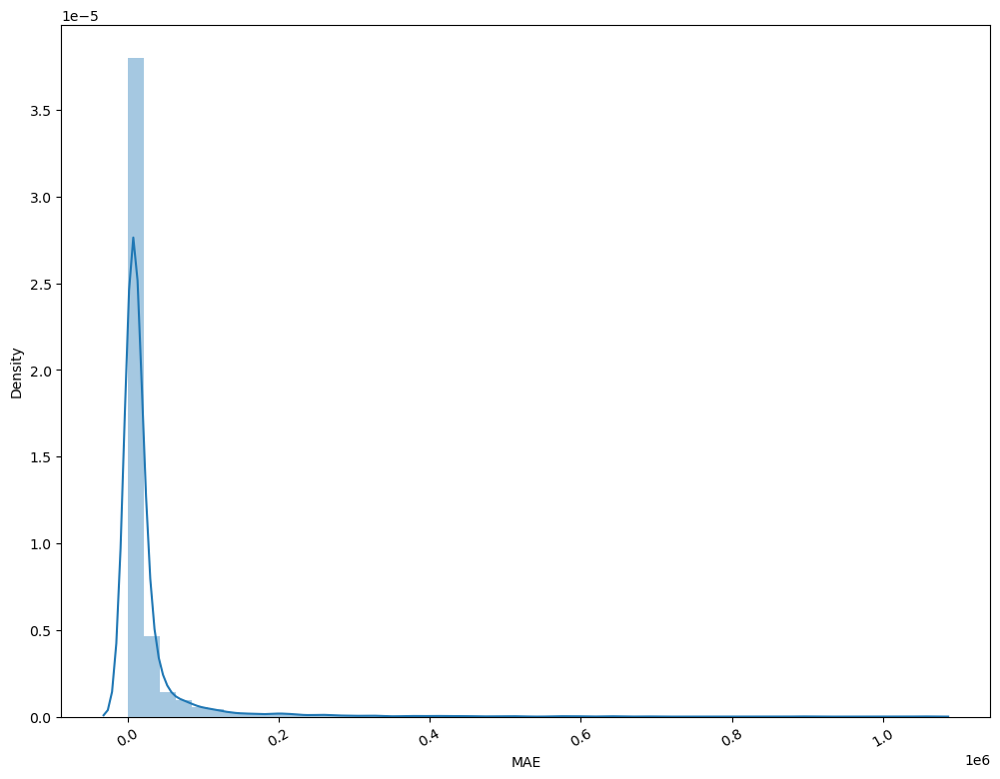

In [41]:
plt.figure(figsize=(12,9))
sns.distplot(evaluation_results.MAE)
# Rotate x-labels
plt.xticks(rotation=30)
plt.show()

The low MAE suggests that the predicted values are close to the actual values, which is great news for the model. The tall bar near 0 indicates that many zip codes have accurate predictions, while the smaller bars to the right represent instances where the predictions deviate more from the actual values.

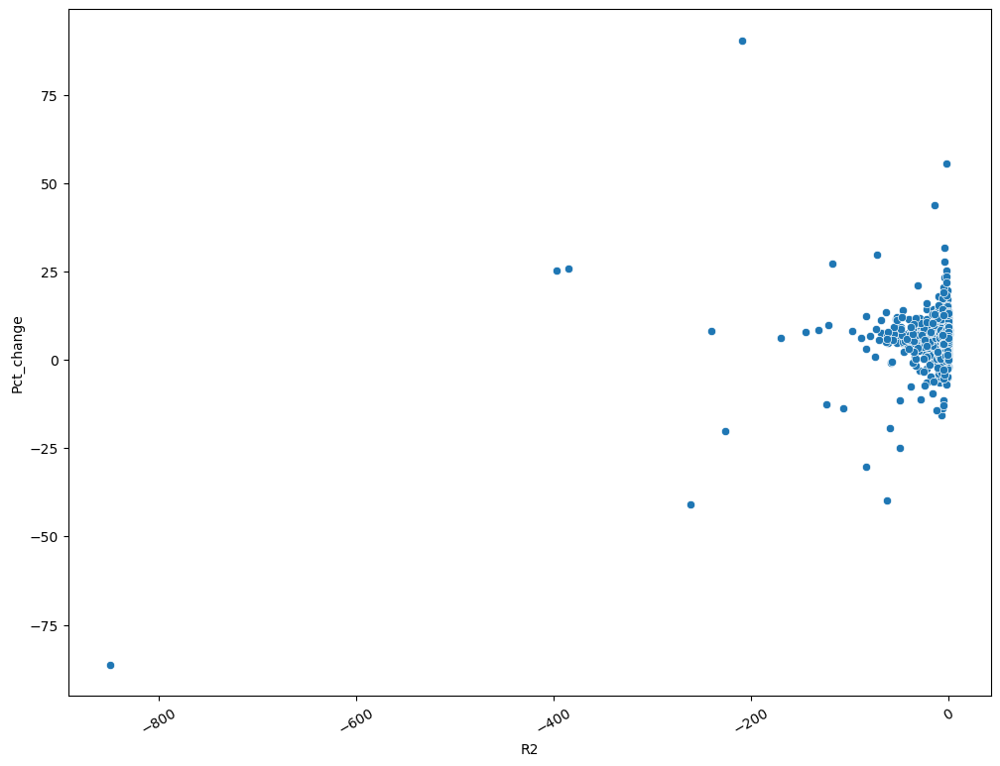

In [42]:
# Enlarge the plot
plt.figure(figsize=(12,9))
sns.scatterplot(x='R2', y='Pct_change', data=evaluation_results)
# Rotate x-labels
plt.xticks(rotation=30)
plt.show()

Overall, the scatter plot suggests that while the model demonstrates relatively consistent performance for the majority of zip codes, there are certain areas where its predictions deviate significantly from the actual percentage changes. 

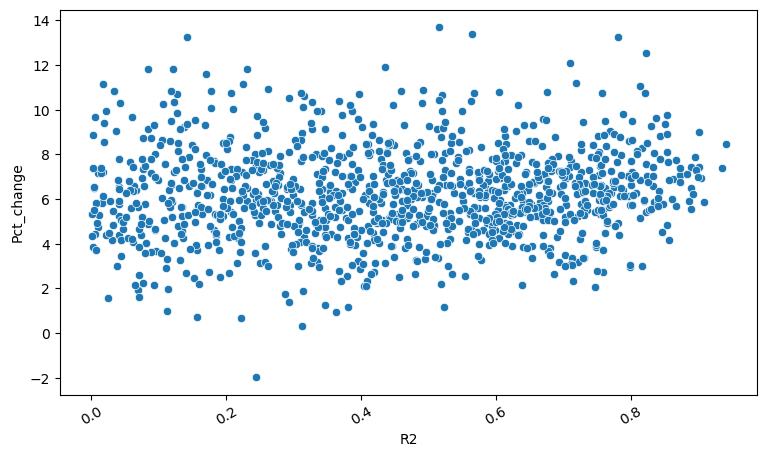

There are 3850 zipcodes in the original data
Now we're limiting to 1132 zipcodes


In [43]:
# Limit the data to R-squared greater than or equal to zero
limit_results = evaluation_results[evaluation_results['R2']>=0]
# Enlarge the plot
plt.figure(figsize=(9,5))
sns.scatterplot(x='R2', y='Pct_change', data=limit_results) # Rotate x-labels
plt.xticks(rotation=30)
plt.show()
# How many models are we losing?
print("There are {} zipcodes in the original data".format(len(evaluation_results)))
print("Now we're limiting to {} zipcodes".format(len(limit_results)))

In [48]:
# Calculate high risk - high reward
hr_hr = limit_results[limit_results['Pct_change'] >= 0].groupby('R2')[['zipcode', 'Pct_change']].min().sort_values('Pct_change')

# Calculate high risk - low reward 
hr_lr = limit_results[limit_results['Pct_change'] < 0].groupby('R2')[['zipcode', 'Pct_change']].min().sort_values('Pct_change')

# Calculate low risk - low reward
lr_lr = limit_results[limit_results['Pct_change'] <= 0].groupby('R2')[['zipcode', 'Pct_change']].max().sort_values('Pct_change', ascending=False)

# Calculate low risk - high reward
lr_hr = limit_results[limit_results['Pct_change'] > 0].groupby('R2')[['zipcode', 'Pct_change']].max().sort_values('Pct_change', ascending=False)

print('High Risk - High Reward: Risky Zip Codes')
print(hr_hr.head(10))
print()
print('High Risk - Low Reward: Avoid these Zip Codes:')
print(hr_lr.head(10))
print()
print('Low Risk - Low Reward: Not Ideal')
print(lr_lr.head(10))
print()
print('Low Risk - High Reward: Best Bet Zip Codes')
print(lr_hr.head(10))

High Risk - High Reward: Risky Zip Codes
         zipcode  Pct_change
R2                          
0.311742   58865        0.33
0.221386   71498        0.68
0.156161   79712        0.70
0.363140   75445        0.94
0.112282   95400        0.98
0.522027   75462        1.16
0.380827   79836        1.18
0.345864   95524        1.26
0.292783   79581        1.38
0.024966   71398        1.58

High Risk - Low Reward: Avoid these Zip Codes:
         zipcode  Pct_change
R2                          
0.243775   79699       -1.97

Low Risk - Low Reward: Not Ideal
         zipcode  Pct_change
R2                          
0.243775   79699       -1.97

Low Risk - High Reward: Best Bet Zip Codes
         zipcode  Pct_change
R2                          
0.515840   71241       13.70
0.563863   98096       13.39
0.781172   93485       13.26
0.142036   71325       13.25
0.822425   97822       12.54
0.709430   93292       12.10
0.434639   93501       11.92
0.230916   98131       11.84
0.120700   97186     

In [49]:
# Obtain the best markets by from the best bet zip codes
zipcodes_final = [71241, 98096, 93485, 71325, 97822, 93292, 93501, 98131, 97186, 79064]
cities = df_filtered[df_filtered.RegionID.isin(zipcodes_final)][['RegionID', 'City', 'State', 'Metro',
                                                                 'CountyName']].drop_duplicates()

In [50]:
# Calculate the average ROI for 3 years and 5 years in the original df_filtered DataFrame
df_filtered['ROI_3_years_avg'] = df_filtered['ROI_3_years'].groupby(df_filtered['RegionID']).transform('mean')
df_filtered['ROI_5_years_avg'] = df_filtered['ROI_5_years'].groupby(df_filtered['RegionID']).transform('mean')

# Filter df for the year 2023
df_2023 = df[df.index.year == 2023]

# Filter df_2023 to include only the rows with zip codes in zipcodes_final
df_2023_filtered = df_2023[df_2023['RegionID'].isin(zipcodes_final)]

# Calculate the average 'value' for 2023 for each city
avg_value_2023 = df_2023_filtered.groupby('RegionID')['value'].mean()

# Merge the city-related information with the ROI averages based on RegionID (zipcode)
merged_df = pd.merge(cities, df_filtered[['RegionID', 'City', 'State', 'Metro', 'CountyName', 'ROI_3_years_avg', 'ROI_5_years_avg']],
                     on='RegionID', how='inner')

# Merge the average value for 2023 with merged_df
merged_df = pd.merge(merged_df, avg_value_2023, left_on='RegionID', right_index=True, how='left')

# Rename the new column to 'avg_value_2023'
merged_df = merged_df.rename(columns={'value': 'avg_value_2023'})

# Drop duplicate rows
merged_df = merged_df.drop_duplicates()

# Print the merged DataFrame
merged_df

,RegionID,City_x,State_x,Metro_x,CountyName_x,City_y,State_y,Metro_y,CountyName_y,ROI_3_years_avg,ROI_5_years_avg,avg_value_2023
0,98131,Modesto,CA,"Modesto, CA",Stanislaus County,Modesto,CA,"Modesto, CA",Stanislaus County,0.467152,6.070610,353097.219754
264,71325,Hephzibah,GA,"Augusta-Richmond County, GA-SC",Richmond County,Hephzibah,GA,"Augusta-Richmond County, GA-SC",Richmond County,3.543233,4.733397,208006.976939
528,97822,Oakland,CA,"San Francisco-Oakland-Berkeley, CA",Alameda County,Oakland,CA,"San Francisco-Oakland-Berkeley, CA",Alameda County,5.787593,14.314858,500426.528627
792,79064,Detroit,MI,"Detroit-Warren-Dearborn, MI",Wayne County,Detroit,MI,"Detroit-Warren-Dearborn, MI",Wayne County,7.006865,13.287208,79917.910514
1056,93292,Denver,CO,"Denver-Aurora-Lakewood, CO",Denver County,Denver,CO,"Denver-Aurora-Lakewood, CO",Denver County,17.370723,26.250685,394250.757771
1320,71241,Buckhead,GA,"Atlanta-Sandy Springs-Alpharetta, GA",Morgan County,Buckhead,GA,"Atlanta-Sandy Springs-Alpharetta, GA",Morgan County,15.126799,17.327027,515431.021289
1584,93501,Pierce,CO,"Greeley, CO",Weld County,Pierce,CO,"Greeley, CO",Weld County,9.649503,8.950905,489900.635130
1848,97186,New Cuyama,CA,"Santa Maria-Santa Barbara, CA",Santa Barbara County,New Cuyama,CA,"Santa Maria-Santa Barbara, CA",Santa Barbara County,3.543233,4.733397,256540.703543
2112,98096,Cressey,CA,"Merced, CA",Merced County,Cressey,CA,"Merced, CA",Merced County,-16.447941,-8.941702,319024.125280
2376,93485,Gilcrest,CO,"Greeley, CO",Weld County,Gilcrest,CO,"Greeley, CO",Weld County,8.199135,10.347323,355502.284626


In [51]:
# Calculating future price based on 3 year ROI
merged_df['Future_Price_3_Years'] = merged_df['avg_value_2023'] * (1 + merged_df['ROI_3_years_avg'] / 100)

# Calculating future price based on 5 year ROI
merged_df['Future_Price_5_Years'] = merged_df['avg_value_2023'] * (1 + merged_df['ROI_5_years_avg'] / 100)

merged_df

,RegionID,City_x,State_x,Metro_x,CountyName_x,City_y,State_y,Metro_y,CountyName_y,ROI_3_years_avg,ROI_5_years_avg,avg_value_2023,Future_Price_3_Years,Future_Price_5_Years
0,98131,Modesto,CA,"Modesto, CA",Stanislaus County,Modesto,CA,"Modesto, CA",Stanislaus County,0.467152,6.070610,353097.219754,354746.721525,374532.374592
264,71325,Hephzibah,GA,"Augusta-Richmond County, GA-SC",Richmond County,Hephzibah,GA,"Augusta-Richmond County, GA-SC",Richmond County,3.543233,4.733397,208006.976939,215377.147931,217852.773164
528,97822,Oakland,CA,"San Francisco-Oakland-Berkeley, CA",Alameda County,Oakland,CA,"San Francisco-Oakland-Berkeley, CA",Alameda County,5.787593,14.314858,500426.528627,529389.179432,572061.877975
792,79064,Detroit,MI,"Detroit-Warren-Dearborn, MI",Wayne County,Detroit,MI,"Detroit-Warren-Dearborn, MI",Wayne County,7.006865,13.287208,79917.910514,85517.650739,90536.769656
1056,93292,Denver,CO,"Denver-Aurora-Lakewood, CO",Denver County,Denver,CO,"Denver-Aurora-Lakewood, CO",Denver County,17.370723,26.250685,394250.757771,462734.964975,497744.283529
1320,71241,Buckhead,GA,"Atlanta-Sandy Springs-Alpharetta, GA",Morgan County,Buckhead,GA,"Atlanta-Sandy Springs-Alpharetta, GA",Morgan County,15.126799,17.327027,515431.021289,593399.234636,604739.894677
1584,93501,Pierce,CO,"Greeley, CO",Weld County,Pierce,CO,"Greeley, CO",Weld County,9.649503,8.950905,489900.635130,537173.612876,533751.174436
1848,97186,New Cuyama,CA,"Santa Maria-Santa Barbara, CA",Santa Barbara County,New Cuyama,CA,"Santa Maria-Santa Barbara, CA",Santa Barbara County,3.543233,4.733397,256540.703543,265630.537353,268683.793779
2112,98096,Cressey,CA,"Merced, CA",Merced County,Cressey,CA,"Merced, CA",Merced County,-16.447941,-8.941702,319024.125280,266551.226929,290497.939879
2376,93485,Gilcrest,CO,"Greeley, CO",Weld County,Gilcrest,CO,"Greeley, CO",Weld County,8.199135,10.347323,355502.284626,384650.398058,392287.252646


# Step 5: INterpret the data, model, analysis, and findings.

## What technique/algorithm/decision process did you use to down sample? (BONUS FOR NOT DOWN SAMPLING)

The technique I used was resample('MS')['value'].mean() in order to do monthly downsampling by mean aggregation beacuse of how huge the data set is. This approach allows for summarizing the data over larger time intervals while preserving the general trend and patterns in the data.

## What three zip codes provide the best investment opportunity for the SREIT? Why?

In [71]:
# Reorder the DataFrame based on ROI_3_years_avg from best to least investment
df_sorted_by_roi_3_years = merged_df.sort_values(by='ROI_3_years_avg', ascending=False)

# Reorder the DataFrame based on ROI_5_years_avg from best to least investment
df_sorted_by_roi_5_years = merged_df.sort_values(by='ROI_5_years_avg', ascending=False)

# For review
selected_columns = ['RegionID', 'City_x', 'State_x', 'ROI_3_years_avg', 'ROI_5_years_avg', 'avg_value_2023', 'Future_Price_3_Years', 'Future_Price_5_Years']
df3_selected = df_sorted_by_roi_3_years[selected_columns].reset_index(drop=True)
df5_selected = df_sorted_by_roi_5_years[selected_columns].reset_index(drop=True)

# Calculate gains for 3 year and 5 year periods
df3_selected['3_year_gain'] = df3_selected['Future_Price_3_Years'] - df3_selected['avg_value_2023']
df3_selected['5_year_gain'] = df3_selected['Future_Price_5_Years'] - df3_selected['avg_value_2023']


# Apply money format to selected columns using map and lambda function
money_format = lambda x: '${:,.2f}'.format(x)

# Apply to 3-year ROI data
df3_selected['avg_value_2023'] = df3_selected['avg_value_2023'].map(money_format)
df3_selected['Future_Price_3_Years'] = df3_selected['Future_Price_3_Years'].map(money_format)
df3_selected['Future_Price_5_Years'] = df3_selected['Future_Price_5_Years'].map(money_format)
df3_selected['3_year_gain'] = df3_selected['3_year_gain'].map(money_format)
df3_selected['5_year_gain'] = df3_selected['5_year_gain'].map(money_format)


print('Top 5 Zip Codes for Investment:')
print(df3_selected.head(3))

Top 5 Zip Codes for Investment:
   RegionID    City_x State_x  ROI_3_years_avg  ROI_5_years_avg  \
0     93292    Denver      CO        17.370723        26.250685   
1     71241  Buckhead      GA        15.126799        17.327027   
2     93501    Pierce      CO         9.649503         8.950905   

  avg_value_2023 Future_Price_3_Years Future_Price_5_Years 3_year_gain  \
0    $394,250.76          $462,734.96          $497,744.28  $68,484.21   
1    $515,431.02          $593,399.23          $604,739.89  $77,968.21   
2    $489,900.64          $537,173.61          $533,751.17  $47,272.98   

   5_year_gain  
0  $103,493.53  
1   $89,308.87  
2   $43,850.54  


Based on the results, the SREIT should consider investing in:

Best: Denver, CO
- Zip code: 93292
- Highest 3 and 5 year ROI, 17.4% and 26.3% respectively
- Gains after 3 years at average median 2023 price: \$68,484.21
- Gains after 5 years at average median 2023 price: \$103,493.53

Next best: Buckhead, GA
- Zip code: 71241
- 15.1% ROI after 3 years, 17.3% ROI after 5 years
- Gains after 3 years at average median 2023 price: \$77,968.21
- Gains after 5 years at average median 2023 price: \$89,308.87

Third best: Pierce, CO
- Zip code: 93501
- 9.6% ROI after 3 years, 9% ROI after 5 years
- Gains after 3 years at average median 2023 price: \$47,272.98
- Gains after 5 years at average median 2023 price: \$43,850.54

# Summary

The analysis conducted in this report aims to provide valuable insights into real estate investment opportunities using forecasted data and historical trends. Several key steps were taken to evaluate model performance, categorize risk-reward profiles, and identify the best investment opportunities.

Firstly, thanks to the guidance of similar reports on medium.com and from tips from Ben Heindl, the forecasted results were merged with observed values to assess the accuracy of the predictive model. Evaluation metrics such as Mean Absolute Error (MAE) and R-squared (R2) were calculated for each zipcode to gauge the model's performance.

Subsequently, zipcodes were categorized into four groups based on their risk and reward profiles: High Risk - High Reward, High Risk - Low Reward, Low Risk - Low Reward, and Low Risk - High Reward. This categorization allowed for the identification of zip codes with varying levels of investment potential.

Three zip codes were selected as the best investment opportunities from the best bets identified from the categorizations above based on the highest Return on Investment (ROI) projections over 3 and 5 years. These zip codes include Denver, CO (93292), Buckhead, GA (71241), and Pierce, CO (93501), each offering attractive ROI potential according to historical trends and forecasted data.

Future price projections were also provided for the selected zip codes based on the average ROI over 3 and 5 years, enabling stakeholders to have an idea of potential returns they can gain to help make informed investment decisions.

In conclusion, this analysis offers valuable insights for stakeholders, particularly the SREIT, seeking to optimize their real estate investment strategies. By leveraging forecasted data and historical trends, investors can identify promising opportunities and allocate resources effectively to maximize returns while minimizing risks in the dynamic real estate market.